# **Customer Purchase Behavior Analysis**

---



# Submitted by: Algin Paulose
Course: Data Analytics

Institution: Entri Elevate


# Project Overview
The Customer Purchase Behavior Analysis project focuses on understanding how customers interact with products and make purchasing decisions. This analysis aims to uncover trends, patterns, and insights that can guide marketing, inventory management, and customer segmentation strategies


# Objective
The main objective of this project is to analyze customer purchase data to identify key factors influencing buying behavior. The study aims to help businesses make data-driven decisions to improve customer satisfaction and sales performance.


# Dataset Description
The dataset used in this project contains customer demographic and transactional data, including features such as customer ID, product category, region, purchase amount, and transaction date. The data was cleaned and preprocessed in Google Colab using Python libraries like Pandas and NumPy


# **Stage 1: Data Cleaning & Preprocessing**
In this stage, the raw dataset was cleaned and made analysis-ready. The following steps were performed:
- Removed duplicate entries
- Handled missing and null values
- Standardized column names and data formats
- Checked data consistency and corrected outliers
- Verified data types for each feature


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

**Explanation:**

We use:

pandas → for data loading and cleaning

numpy → for numeric operations

matplotlib / seaborn → for quick missing-value or outlier checks

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Purchase Behavior.csv to Purchase Behavior.csv


In [ ]:
df = pd.read_csv("Purchase Behavior.csv")

**Explanation:**

Colab uses the files.upload() method to manually upload CSVs.

You can also use Google Drive mount if your dataset is large.

In [ ]:
print(df.shape)

(500000, 17)


In [ ]:
df.head()

,Age,AnnualIncome,NumberOfPurchases,TimeSpentOnWebsite,CustomerTenureYears,LastPurchaseDaysAgo,Gender,ProductCategory,PreferredDevice,Region,ReferralSource,CustomerSegment,LoyaltyProgram,DiscountsAvailed,SessionCount,CustomerSatisfaction,PurchaseStatus
0,37,57722.57241,19,5.908826,1.093430,11,Male,Furniture,Desktop,South,Paid Ads,Regular,1,5,3,2,1
1,63,21328.92588,10,6.970749,0.649246,20,Female,Furniture,Mobile,East,Organic,VIP,0,4,2,3,0
2,60,150537.74250,19,35.004954,3.858211,25,Male,Electronics,Desktop,South,Organic,VIP,1,2,5,2,0
3,19,63508.76255,10,14.818000,7.554374,20,Male,Furniture,Desktop,West,Paid Ads,Premium,0,0,1,3,0
4,54,100399.55840,19,55.925462,0.197411,92,Male,Electronics,Mobile,South,Referral,Regular,1,4,1,2,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Age                   500000 non-null  int64  
 1   AnnualIncome          500000 non-null  float64
 2   NumberOfPurchases     500000 non-null  int64  
 3   TimeSpentOnWebsite    500000 non-null  float64
 4   CustomerTenureYears   500000 non-null  float64
 5   LastPurchaseDaysAgo   500000 non-null  int64  
 6   Gender                500000 non-null  object 
 7   ProductCategory       500000 non-null  object 
 8   PreferredDevice       500000 non-null  object 
 9   Region                500000 non-null  object 
 10  ReferralSource        500000 non-null  object 
 11  CustomerSegment       500000 non-null  object 
 12  LoyaltyProgram        500000 non-null  int64  
 13  DiscountsAvailed      500000 non-null  int64  
 14  SessionCount          500000 non-null  int64  
 15  

**Explanation:**

shape → gives dataset size

info() → shows nulls and column types

head() → gives a snapshot of your Data

In [ ]:
print("Before removing duplicates:", df.shape)
df.drop_duplicates(inplace=True)
print("After removing duplicates:", df.shape)

Before removing duplicates: (500000, 17)
After removing duplicates: (500000, 17)


**Explanation:**

Duplicate rows inflate your statistics and bias analysis.

drop_duplicates() removes repeated rows.

In [ ]:
df.isnull().sum()

,0
Age,0
AnnualIncome,0
NumberOfPurchases,0
TimeSpentOnWebsite,0
CustomerTenureYears,0
LastPurchaseDaysAgo,0
Gender,0
ProductCategory,0
PreferredDevice,0
Region,0


In [ ]:
missing_percentage = (df.isnull().sum() / len(df)) * 100
print(missing_percentage)

Age                     0.0
AnnualIncome            0.0
NumberOfPurchases       0.0
TimeSpentOnWebsite      0.0
CustomerTenureYears     0.0
LastPurchaseDaysAgo     0.0
Gender                  0.0
ProductCategory         0.0
PreferredDevice         0.0
Region                  0.0
ReferralSource          0.0
CustomerSegment         0.0
LoyaltyProgram          0.0
DiscountsAvailed        0.0
SessionCount            0.0
CustomerSatisfaction    0.0
PurchaseStatus          0.0
dtype: float64


In [ ]:
df['Age'].fillna(df['Age'].median(), inplace=True)

/tmp/ipython-input-1933487976.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Age'].fillna(df['Age'].median(), inplace=True)


In [ ]:
df['Gender'].fillna(df['Gender'].mode()[0], inplace=True)

/tmp/ipython-input-3657246551.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Gender'].fillna(df['Gender'].mode()[0], inplace=True)


**Explanation:**

You’ll identify columns with missing values to decide what to do next:

Drop rows/columns if they have too many missing values

Fill with mean/median/mode for numeric columns

Fill with “Unknown” for categorical columns

In [ ]:
print("Final Dataset Info:")
df.info()

Final Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Age                   500000 non-null  int64         
 1   AnnualIncome          500000 non-null  float64       
 2   NumberOfPurchases     500000 non-null  int64         
 3   TimeSpentOnWebsite    500000 non-null  float64       
 4   CustomerTenureYears   500000 non-null  float64       
 5   LastPurchaseDaysAgo   500000 non-null  datetime64[ns]
 6   Gender                500000 non-null  object        
 7   ProductCategory       500000 non-null  object        
 8   PreferredDevice       500000 non-null  object        
 9   Region                500000 non-null  object        
 10  ReferralSource        500000 non-null  object        
 11  CustomerSegment       500000 non-null  object        
 12  LoyaltyProgram        500000 non-null 

In [ ]:
print("\nRemaining Missing Values:\n", df.isnull().sum())



Remaining Missing Values:
 Age                     0
AnnualIncome            0
NumberOfPurchases       0
TimeSpentOnWebsite      0
CustomerTenureYears     0
LastPurchaseDaysAgo     0
Gender                  0
ProductCategory         0
PreferredDevice         0
Region                  0
ReferralSource          0
CustomerSegment         0
LoyaltyProgram          0
DiscountsAvailed        0
SessionCount            0
CustomerSatisfaction    0
PurchaseStatus          0
dtype: int64


In [ ]:
df.head()

,Age,AnnualIncome,NumberOfPurchases,TimeSpentOnWebsite,CustomerTenureYears,LastPurchaseDaysAgo,Gender,ProductCategory,PreferredDevice,Region,ReferralSource,CustomerSegment,LoyaltyProgram,DiscountsAvailed,SessionCount,CustomerSatisfaction,PurchaseStatus
0,37,57722.57241,19,5.908826,1.093430,1970-01-01 00:00:00.000000011,Male,Furniture,Desktop,South,Paid Ads,Regular,1,5,3,2,1
1,63,21328.92588,10,6.970749,0.649246,1970-01-01 00:00:00.000000020,Female,Furniture,Mobile,East,Organic,VIP,0,4,2,3,0
2,60,150537.74250,19,35.004954,3.858211,1970-01-01 00:00:00.000000025,Male,Electronics,Desktop,South,Organic,VIP,1,2,5,2,0
3,19,63508.76255,10,14.818000,7.554374,1970-01-01 00:00:00.000000020,Male,Furniture,Desktop,West,Paid Ads,Premium,0,0,1,3,0
4,54,100399.55840,19,55.925462,0.197411,1970-01-01 00:00:00.000000092,Male,Electronics,Mobile,South,Referral,Regular,1,4,1,2,0


**Interpretation:**

No missing or duplicate rows remain.

All data types are corrected.

Dataset now ready for Exploratory Data Analysis (EDA).

In [ ]:
df.to_csv('/content/Cleaned_Purchase_Behavior.csv', index=False)

**Explanation:**

Saving creates a reliable dataset for your next stage (EDA).

# **Stage 2: Exploratory Data Analysis (EDA)**
Exploratory Data Analysis (EDA) was conducted to visualize and understand customer purchasing patterns. The following techniques and charts were used:
- Distribution plots for purchase frequency
- Bar charts for top-performing product categories
- Regional purchase analysis
- Correlation analysis between customer demographics and spending behavior
- Time-based trend analysis to observe purchase cycles


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
sns.set(style="whitegrid", palette="pastel")

**Explanation:**


Matplotlib – basic plots

Seaborn – advanced statistical plots

Plotly – interactive visuals

In [ ]:
df.describe(include='all')

,Age,AnnualIncome,NumberOfPurchases,TimeSpentOnWebsite,CustomerTenureYears,LastPurchaseDaysAgo,Gender,ProductCategory,PreferredDevice,Region,ReferralSource,CustomerSegment,LoyaltyProgram,DiscountsAvailed,SessionCount,CustomerSatisfaction,PurchaseStatus,Purchase Month
count,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000,500000,500000,500000,500000,500000,500000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,2,5,3,4,5,3,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,Male,Fashion,Mobile,South,Organic,Premium,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,252560,111330,272131,177889,207991,237347,NaN,NaN,NaN,NaN,NaN,NaN
mean,43.941044,85071.804966,11.387584,30.594395,2.163483,1970-01-01 00:00:00.000000060,NaN,NaN,NaN,NaN,NaN,NaN,0.501110,3.154496,2.351750,3.219764,0.418354,1.173954
min,15.000000,11966.385650,-1.000000,-3.804161,-0.418429,1969-12-31 23:59:59.999999989,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
25%,30.000000,51998.815727,6.000000,15.843041,0.592285,1970-01-01 00:00:00.000000016,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,2.000000,1.000000,3.000000,0.000000,1.000000
50%,44.000000,83748.351845,12.000000,30.763164,1.466097,1970-01-01 00:00:00.000000031,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,3.000000,2.000000,3.000000,0.000000,1.000000
75%,57.000000,116554.694575,16.000000,45.012866,3.009516,1970-01-01 00:00:00.000000105,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,5.000000,3.000000,4.000000,1.000000,1.000000
max,81.000000,204178.294400,28.000000,78.364251,15.346356,1970-01-01 00:00:00.000000189,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,10.000000,12.000000,5.000000,1.000000,12.000000


**Explanation:**

Gives a statistical overview: mean, median, count, etc., to understand the general distribution of numerical columns.

# Distribution of Total Purchase

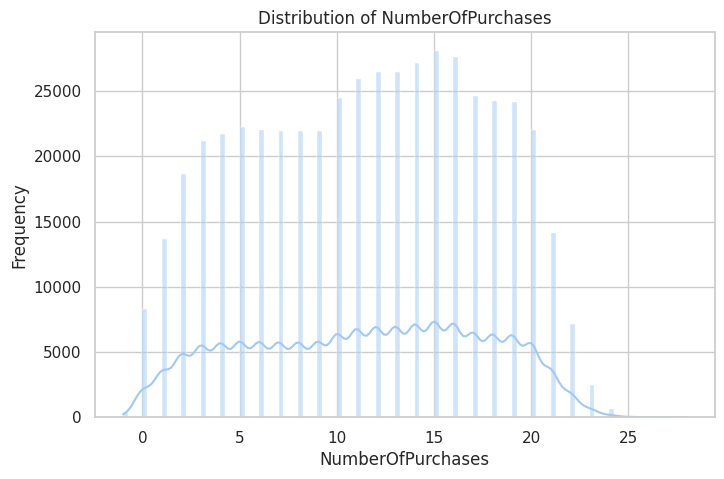

In [ ]:
plt.figure(figsize=(8,5))
sns.histplot(df['NumberOfPurchases'], kde=True)
plt.title('Distribution of NumberOfPurchases')
plt.xlabel('NumberOfPurchases')
plt.ylabel('Frequency')
plt.show()

**Explanation:**

Shows how customer spending is distributed — helps detect high/low spenders and outliers.

# Gender-wise Purchase Behavior

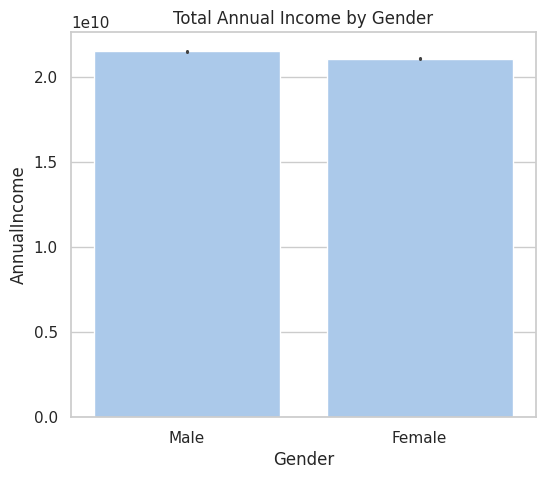

In [ ]:
plt.figure(figsize=(6,5))
sns.barplot(x='Gender', y='AnnualIncome', data=df, estimator=sum)
plt.title('Total Annual Income by Gender')
plt.show()

**Explanation:**

Compares total purchase value across gender categories.

# Product Category Popularity

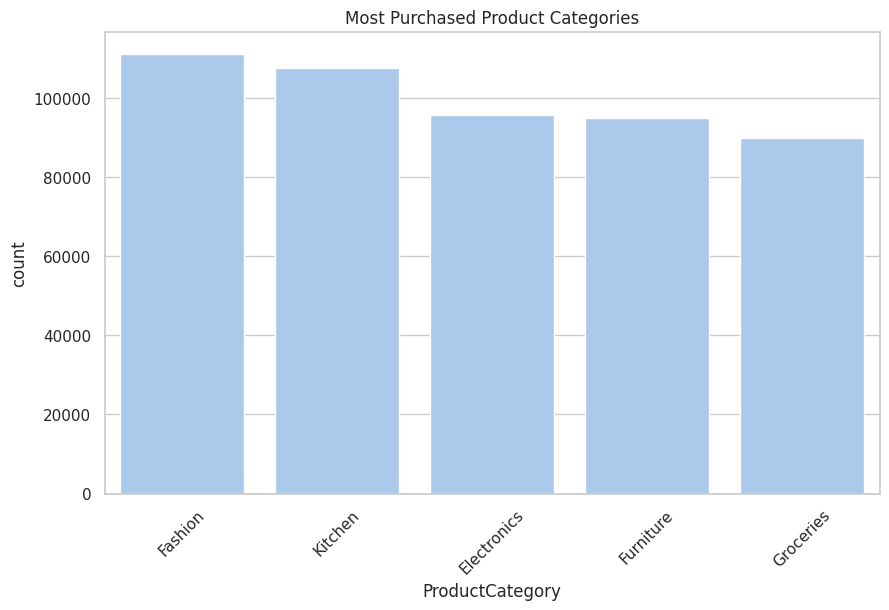

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='ProductCategory', order=df['ProductCategory'].value_counts().index)
plt.title('Most Purchased Product Categories')
plt.xticks(rotation=45)
plt.show()

**Explanation:**

Shows which product categories are purchased most often.

# Average Spend per Product Category

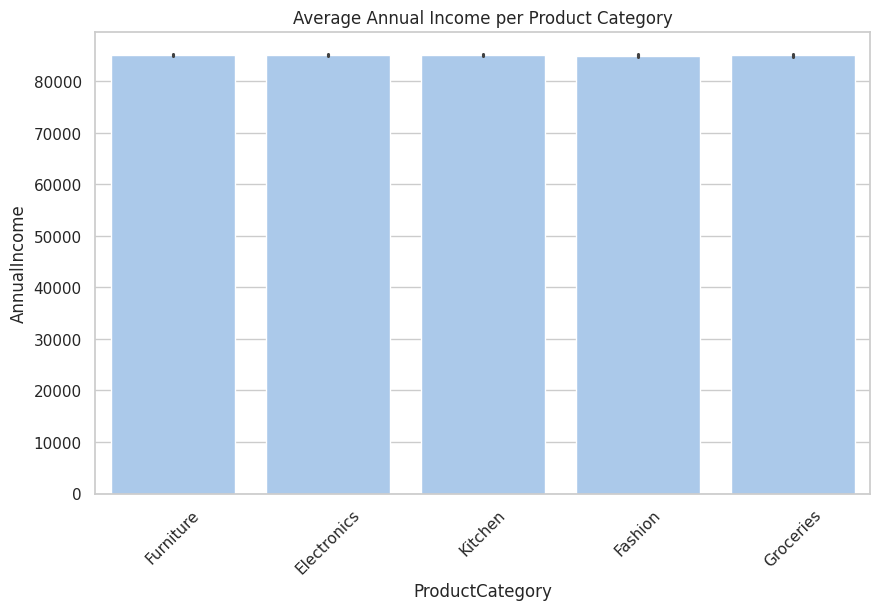

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='ProductCategory', y='AnnualIncome', data=df, estimator=np.mean)
plt.title('Average Annual Income per Product Category')
plt.xticks(rotation=45)
plt.show()

**Explanation:**

Highlights high-value categories where customers spend more on average.

# Top 10 Customers by Spend

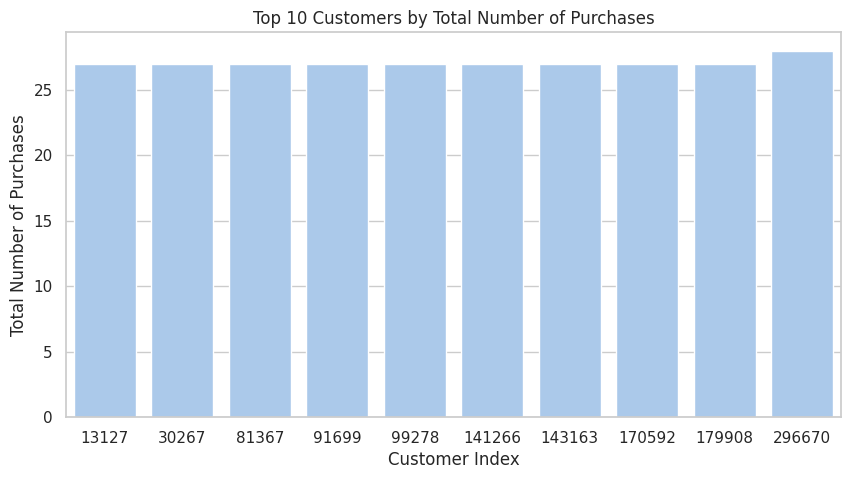

In [ ]:
top_customers = df.groupby(df.index)['NumberOfPurchases'].sum().nlargest(10)
plt.figure(figsize=(10,5))
sns.barplot(x=top_customers.index, y=top_customers.values)
plt.title('Top 10 Customers by Total Number of Purchases')
plt.xlabel('Customer Index')
plt.ylabel('Total Number of Purchases')
plt.show()

**Explanation:**

Identifies top-spending customers — useful for loyalty or marketing strategies.

# Region

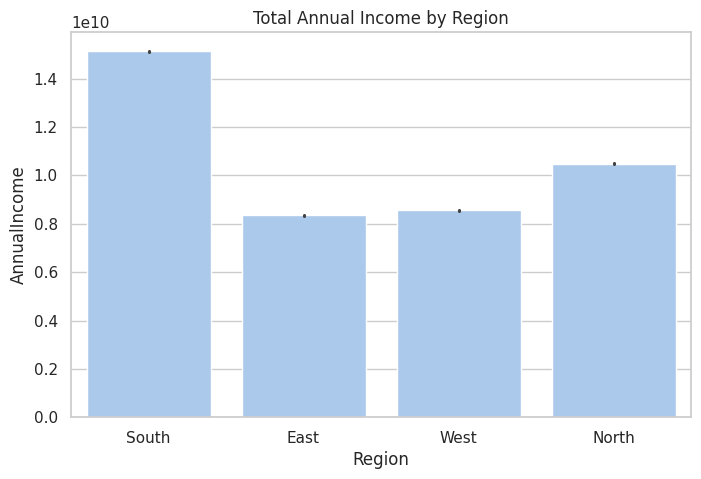

In [ ]:
if 'Region' in df.columns:
    plt.figure(figsize=(8,5))
    sns.barplot(x='Region', y='AnnualIncome', data=df, estimator=sum)
    plt.title('Total Annual Income by Region')
    plt.show()

**Explanation:**

Visualizes geographical performance differences.

# Distribution of Number of Purchases

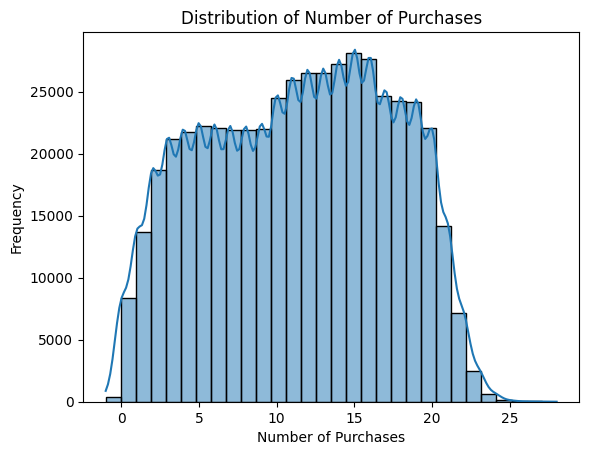

In [ ]:
sns.histplot(df['NumberOfPurchases'], kde=True, bins=30)
plt.title("Distribution of Number of Purchases")
plt.xlabel("Number of Purchases")
plt.ylabel("Frequency")
plt.show()

**Explanation**

This histogram shows the frequency distribution of the number of items (or purchases) per transaction.

# Customer Count by Segment

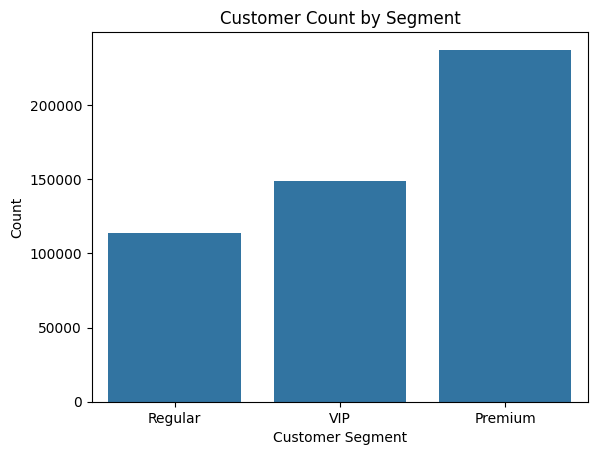

In [ ]:
sns.countplot(x='CustomerSegment', data=df)
plt.title("Customer Count by Segment")
plt.xlabel("Customer Segment")
plt.ylabel("Count")
plt.show()

# Age vs Number of Purchases

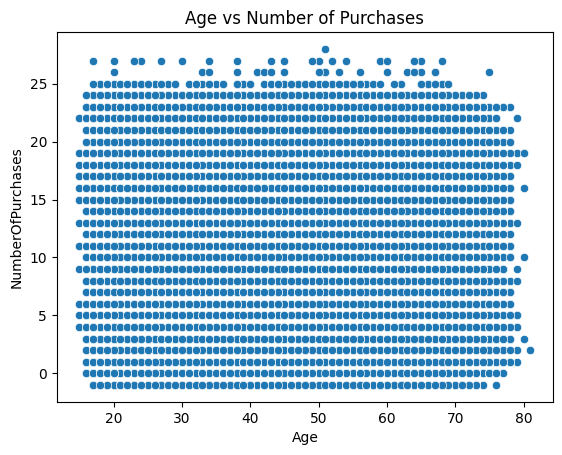

In [ ]:
sns.scatterplot(x='Age', y='NumberOfPurchases', data=df)
plt.title("Age vs Number of Purchases")
plt.show()

**Explanation**

This line plot examines how purchase frequency varies across age groups.

# Revenue by Segment and Region

In [ ]:
pivot = df.pivot_table(values='AnnualIncome',
                       index='CustomerSegment',
                       columns='Region',
                       aggfunc='sum')

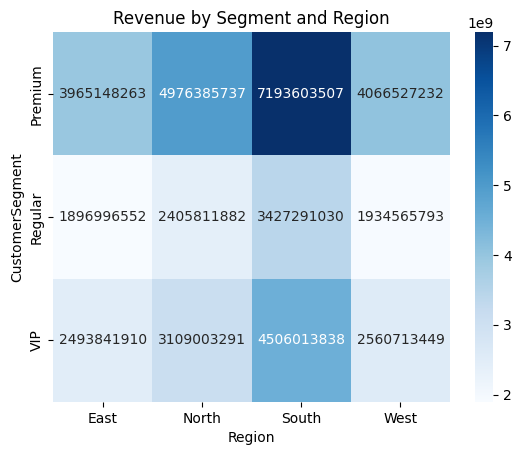

In [ ]:
sns.heatmap(pivot, annot=True, fmt='.0f', cmap='Blues')
plt.title("Revenue by Segment and Region")
plt.show()

**Explanation**

This grouped bar chart shows how revenue contributions differ by both customer segment and region.

# Correlation Heatmap

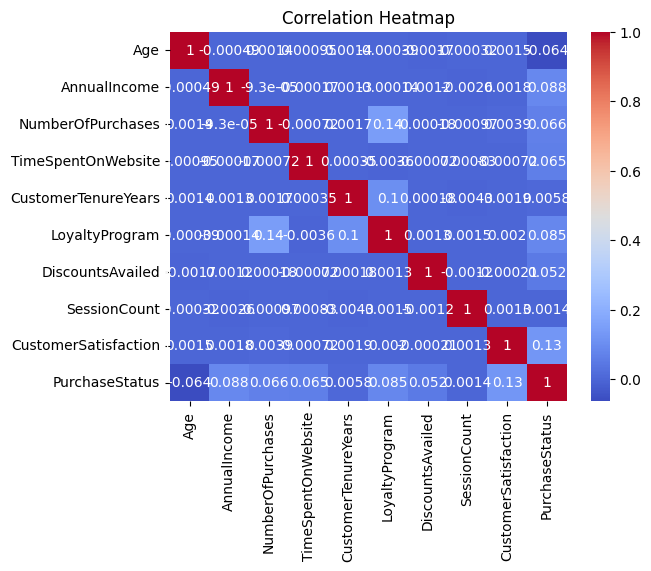

In [ ]:
corr = df.corr(numeric_only=True)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

**Explanation:**

Helps find relationships between numeric features (e.g., quantity, price, spend).

# Monthly Purchase Trend

In [ ]:
df['Purchase Month'] = df['LastPurchaseDaysAgo'].dt.month
monthly_sales = df.groupby('Purchase Month')['NumberOfPurchases'].sum().reset_index()

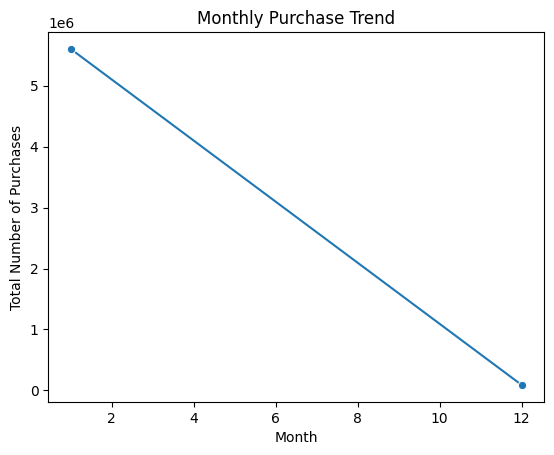

In [ ]:
sns.lineplot(x='Purchase Month', y='NumberOfPurchases', data=monthly_sales, marker='o')
plt.title("Monthly Purchase Trend")
plt.xlabel("Month")
plt.ylabel("Total Number of Purchases")
plt.show()

**Explanation:**

Shows sales performance trend across months — reveals seasonal buying patterns.

# Top 5 Product Categories by Number of Purchases

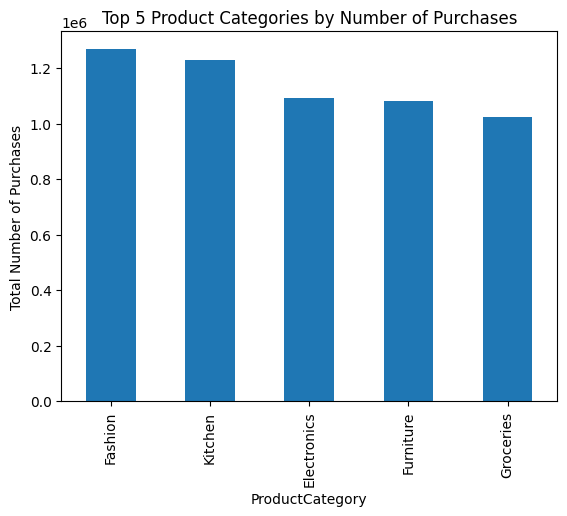

In [ ]:
top_products = df.groupby('ProductCategory')['NumberOfPurchases'].sum().nlargest(5)
top_products.plot(kind='bar', title='Top 5 Product Categories by Number of Purchases')
plt.ylabel("Total Number of Purchases")
plt.show()

# Interactive Visualization

In [ ]:
fig = px.scatter(df, x='AnnualIncome', y='NumberOfPurchases', color='ProductCategory',
                 hover_data=['Age', 'Gender', 'CustomerSegment'])
fig.update_layout(title='Interactive View: Annual Income vs Number of Purchases by Product Category')
fig.show()

**Explanation:**

Interactive scatter plot — helps explore purchase behavior dynamically.

In [ ]:
plt.savefig('/content/EDA_visuals_chart1.png')

<Figure size 640x480 with 0 Axes>

# Insights & Key Findings
Key observations from the EDA include:
- Certain product categories contributed to higher revenue concentration.
- Customers from specific regions showed distinct purchase preferences.
- Purchase trends indicated peak activity during specific time periods.
- A small group of high-value customers contributed a large share of total purchases.


# Summary of Work Done
The overall workflow of the project included:
- Importing and exploring the dataset
- Performing data cleaning and preprocessing
- Conducting exploratory analysis and generating visual insights
- Summarizing customer behavior patterns
- Documenting findings in a structured report


# Conclusion
This project successfully demonstrated how data analysis techniques can uncover valuable insights from customer purchase behavior. The findings can assist organizations in:
- Enhancing customer targeting and retention strategies
- Optimizing product recommendations
- Improving inventory planning and marketing campaigns
Future improvements could include predictive modeling to forecast customer purchases and segmentation using machine learning techniques.


# Tools & Technologies Used
- Python
- Google Colab
- Pandas, NumPy
- Matplotlib, Seaborn
- Jupyter Notebook
